In [91]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import numpy as np
import scipy as sp
import scipy.stats as sp_stats
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import LZH_Utilities as utl
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [2]:
df_full = utl.read_time_series_data("full_rank_dataset")
df_all = utl.read_time_series_data("all_dataset")

In [3]:
print("Full ranked dataset: {0}\nAll dataset: {1}".format(df_full[0].shape, df_all[0].shape))

Full ranked dataset: (43830, 10)
All dataset: (169824, 10)


In [4]:
df_full_arr = pd.concat(df_full, ignore_index=True)
df_all_arr  = pd.concat(df_all,  ignore_index=True)

In [5]:
df_all_arr.columns[1:-2]

Index(['LTS', 'SST', 'Subsidence', 'Night_Day', 'RH', 'q', 'wsp'], dtype='object')

In [6]:
missing_data_count = np.sum([np.count_nonzero(np.isnan(df_all_arr[col_name])) for col_name in df_all_arr.columns[1:-2]])
all_data_count = np.sum([len(df_all_arr[col_name]) for col_name in df_all_arr.columns[1:-2]])
print("Count: {}\nMissing Count: {}\nRatio: {}".format(all_data_count, missing_data_count, missing_data_count/all_data_count))

Count: 10698912
Missing Count: 2922010
Ratio: 0.27311281745284005


In [7]:
print("              All Dataset\t   Full Ranked")
for col_name in df_all_arr.columns[1:]:
    print("{0}: ".format(col_name))
    print("    Mean: {0:14.5f}\t{1:14.5f}".format(np.mean(df_all_arr[col_name]), np.mean(df_full_arr[col_name])))
    print("      SD: {0:14.5f}\t{1:14.5f}".format(np.std(df_all_arr[col_name]),  np.std(df_full_arr[col_name])))
    print()

    

              All Dataset	   Full Ranked
LTS: 
    Mean:       18.71252	      18.53834
      SD:        3.89426	       3.73204

SST: 
    Mean:      294.75173	     294.85474
      SD:        4.80033	       3.44829

Subsidence: 
    Mean:        0.03350	       0.04162
      SD:        0.10163	       0.08741

Night_Day: 
    Mean:        0.49851	       0.49790
      SD:        0.50000	       0.50000

RH: 
    Mean:       75.44503	      74.30206
      SD:        8.71765	       8.49031

q: 
    Mean:        0.00255	       0.00202
      SD:        0.00237	       0.00195

wsp: 
    Mean:        6.87510	       7.14012
      SD:        2.48379	       2.44361

TCC: 
    Mean:       68.39179	      67.51949
      SD:       27.34473	      26.82362

UnobstructedLC: 
    Mean:     6360.94732	    6455.88213
      SD:     2636.16666	    2563.74168



In [8]:
pd.DataFrame(
    data={
        "{}".format(col_name): [np.mean(df_all_arr[col_name]), np.mean(df_full_arr[col_name])]
        for col_name in df_all_arr.columns[1:-1]
    },
    index=["All Dataset", "Full Ranked Dataset"]
)

,LTS,SST,Subsidence,Night_Day,RH,q,wsp,TCC
All Dataset,18.712524,294.751733,0.033498,0.498506,75.445031,0.002553,6.875102,68.391792
Full Ranked Dataset,18.538340,294.854740,0.041616,0.497896,74.302060,0.002016,7.140118,67.519495


In [9]:
pd.DataFrame(
    data={
        "{}".format(col_name): [np.std(df_all_arr[col_name]), np.std(df_full_arr[col_name])]
        for col_name in df_all_arr.columns[1:-1]
    },
    index=["All Dataset", "Full Ranked Dataset"]
)

,LTS,SST,Subsidence,Night_Day,RH,q,wsp,TCC
All Dataset,3.894260,4.800335,0.101633,0.499998,8.717653,0.002366,2.483786,27.344731
Full Ranked Dataset,3.732041,3.448289,0.087411,0.499996,8.490310,0.001950,2.443611,26.823618


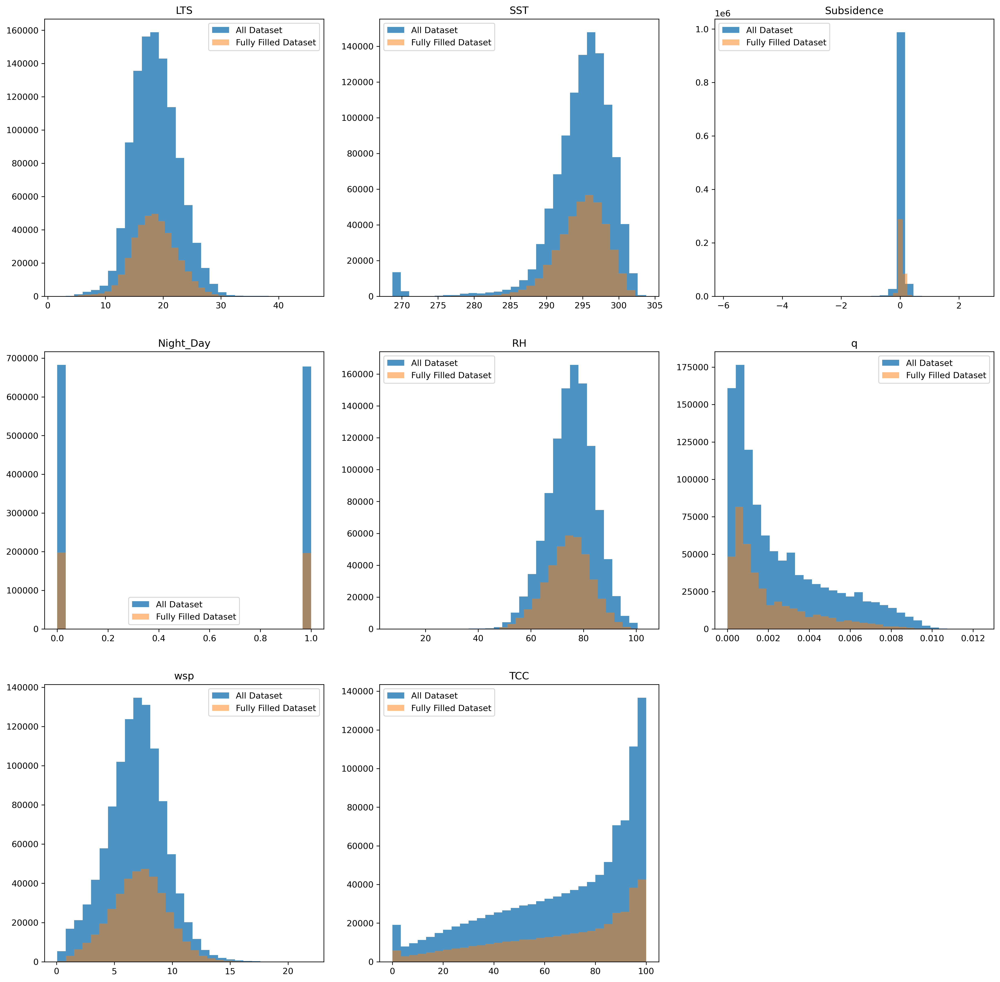

In [10]:
plt.figure(figsize=[20, 20])
for idx, col_name in enumerate(df_all_arr.columns[1:-1]):
    df_all_col = df_all_arr[col_name][np.logical_not(np.isnan(df_all_arr[col_name]))]
    
    plt.subplot(3, 3, idx + 1)
    
    plt.hist(df_all_col, 30, alpha=0.8)
    plt.hist(df_full_arr[col_name], 30, alpha=0.5)
    
    plt.legend(["All Dataset", "Fully Filled Dataset"])
    
    plt.title(col_name)
plt.show()

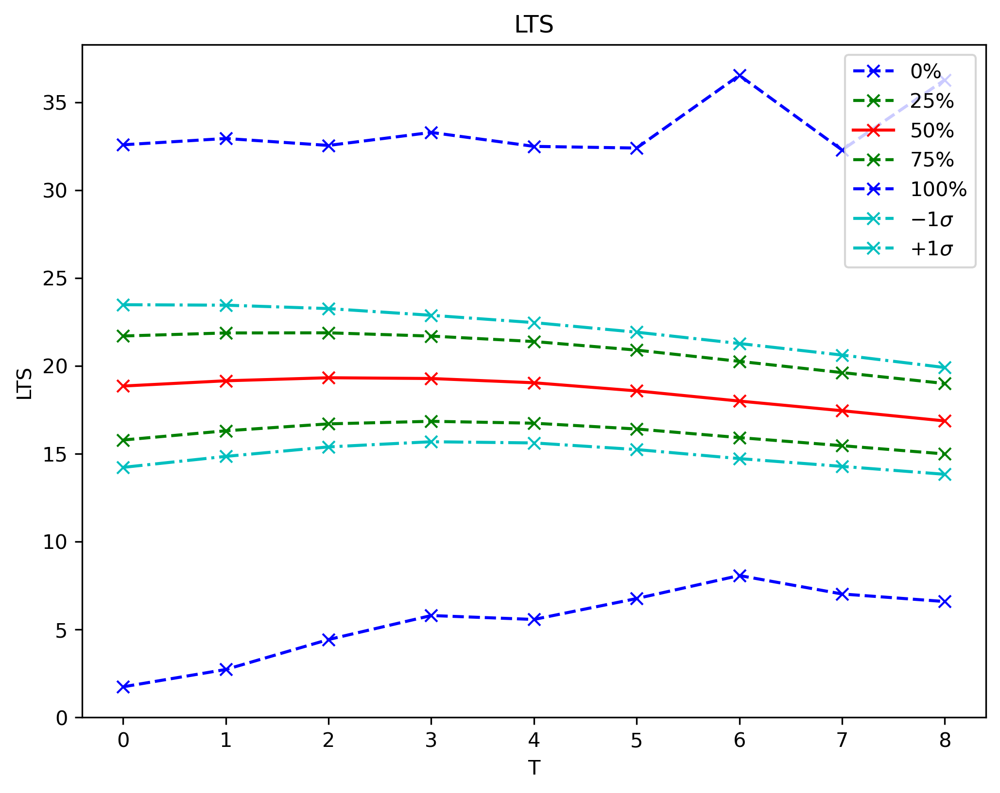

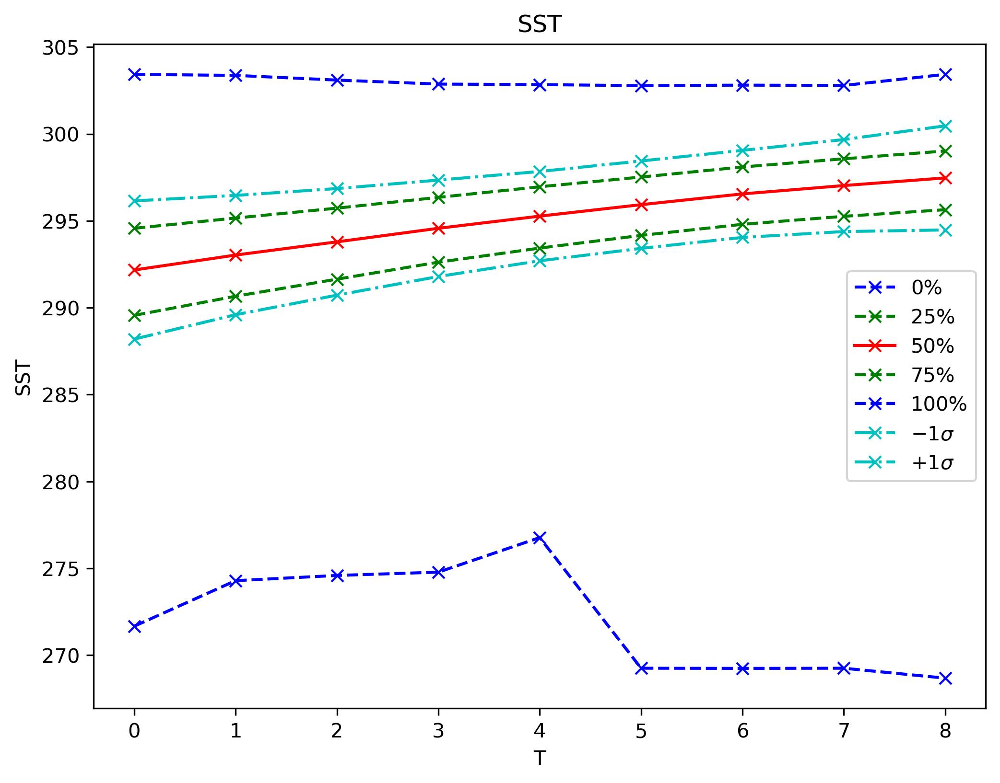

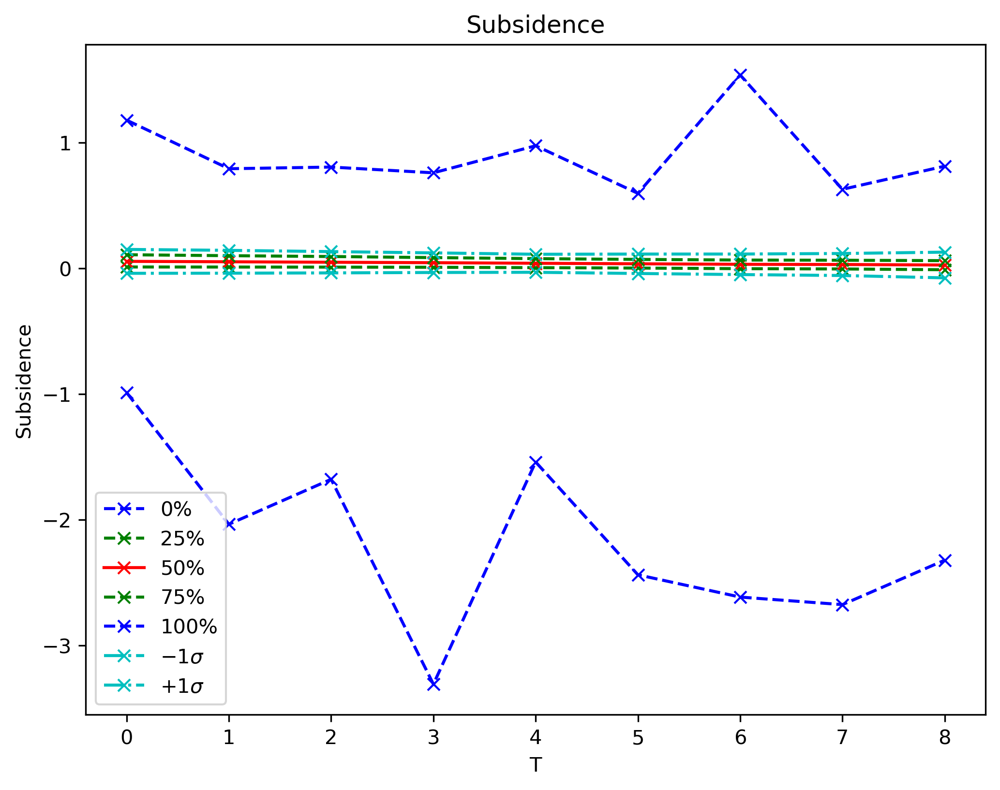

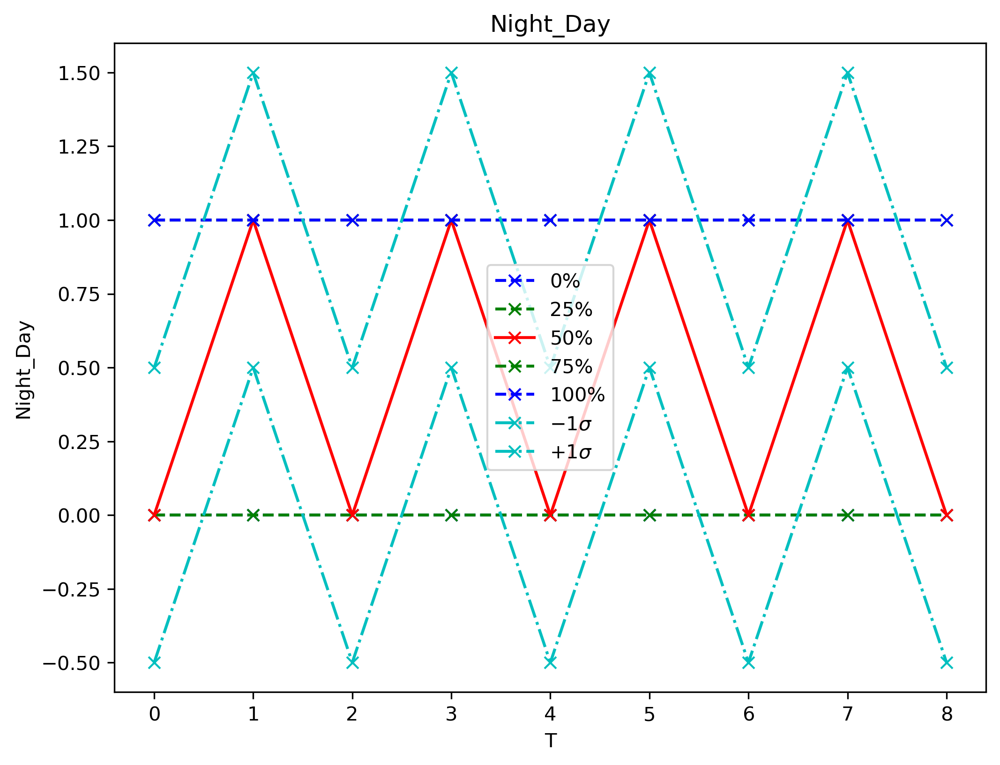

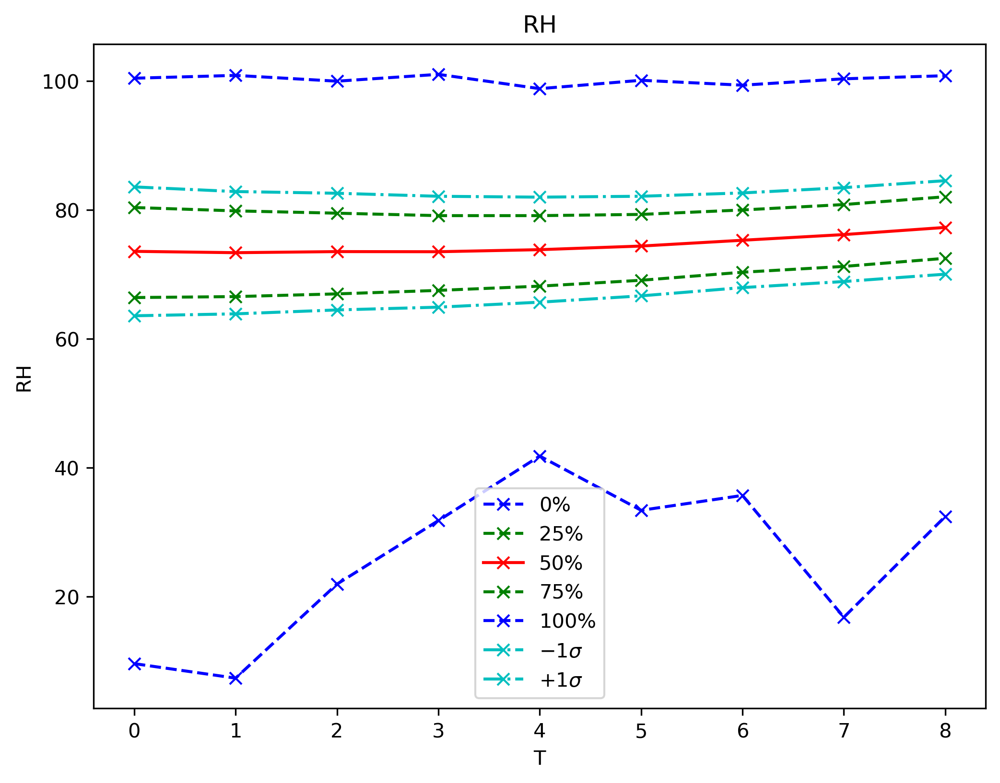

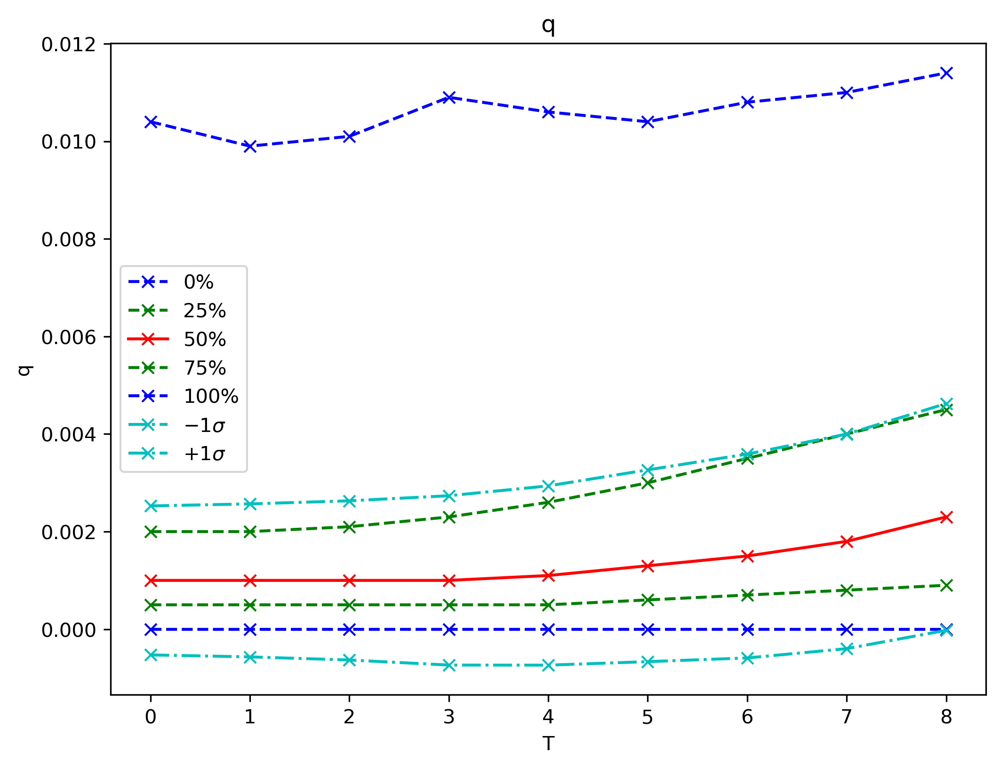

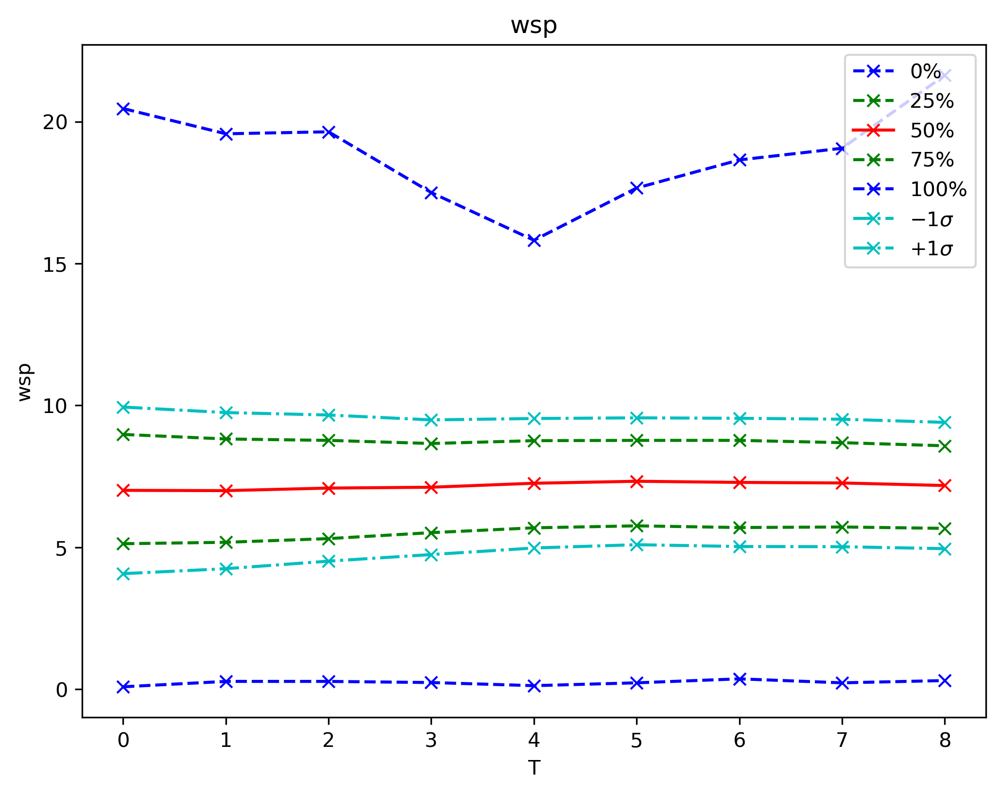

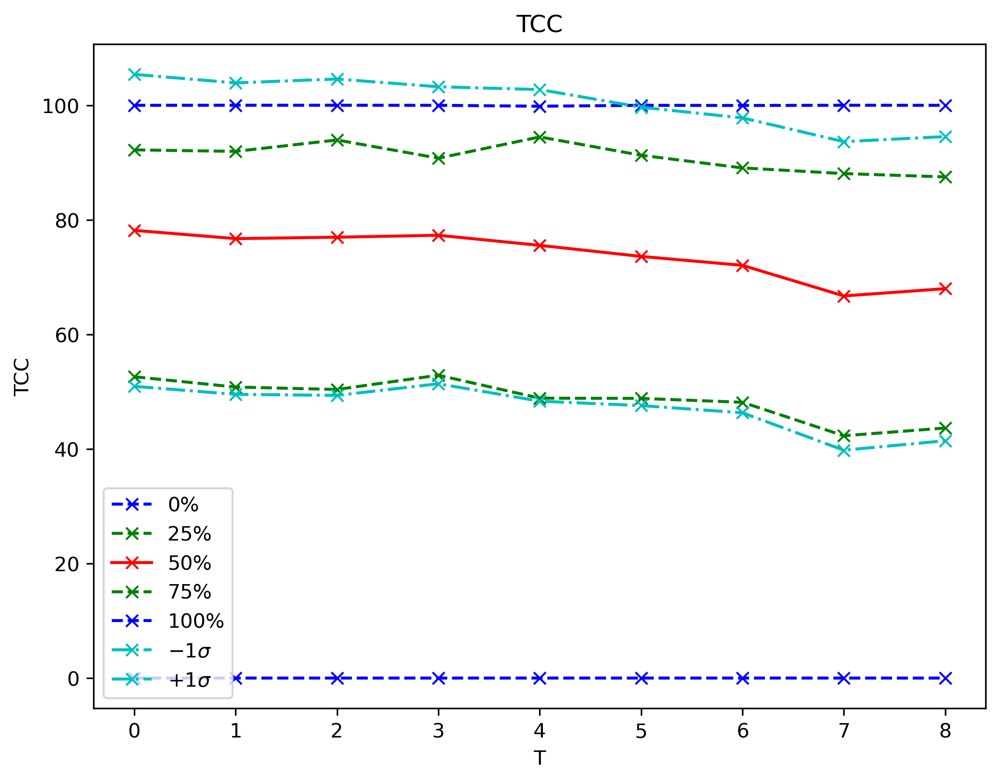

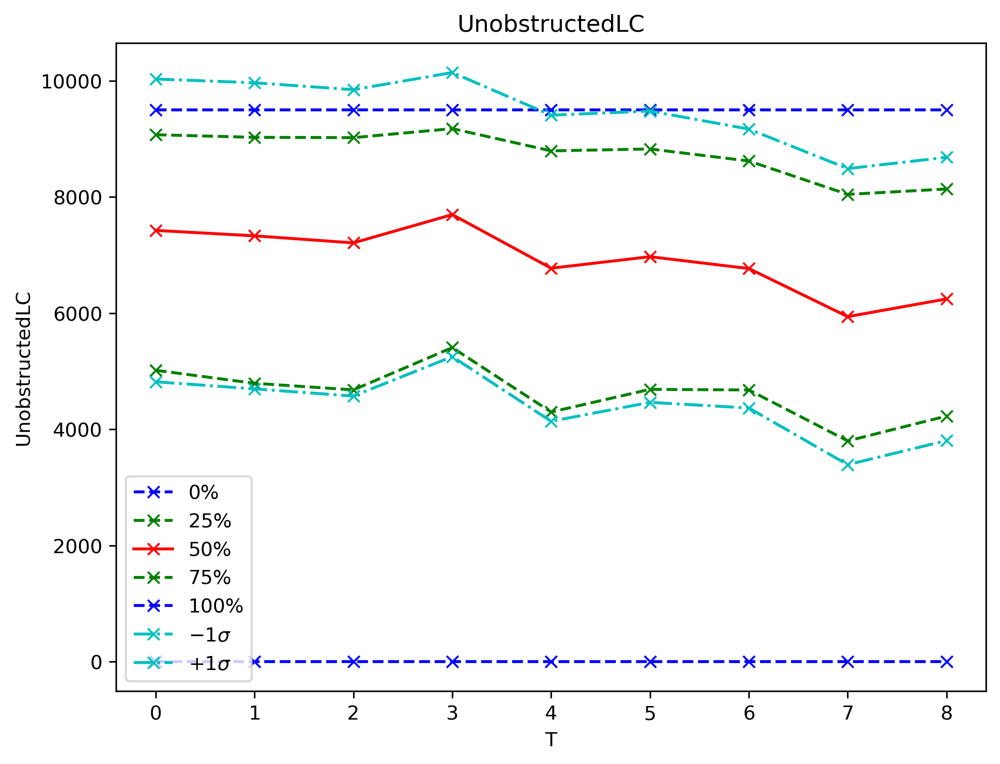

In [11]:
col_names = df_full[0].columns[1:]
for col_name in col_names:
    y_data = []
    y_sd = []
    for time in np.arange(9):
        y_data.append([np.percentile(df_full[time][col_name], i) for i in [0, 25, 50, 75, 100]])
        y_sd.append(np.std(df_full[time][col_name]))
    y_sd = np.array(y_sd) 
    y_data = np.array(y_data)
        
    plt.figure(figsize=[8, 6])
    
    plt.plot(y_data[:, 0], "b--x")
    plt.plot(y_data[:, 1], "g--x")
    plt.plot(y_data[:, 2], "r-x")
    plt.plot(y_data[:, 3], "g--x")
    plt.plot(y_data[:, 4], "b--x")
    
    plt.plot(y_data[:, 2]-y_sd, "c-.x")
    plt.plot(y_data[:, 2]+y_sd, "c-.x")
    
    
    
    plt.xlabel("T")
    plt.ylabel(col_name)
    
    legend = ["{0}%".format(i) for i in [0, 25, 50, 75, 100]]
    legend.append("$-1\sigma$")
    legend.append("$+1\sigma$")
    plt.legend(legend)
    
    plt.title(col_name)
    plt.show()

## Cov Matrix

In [12]:
def cap_cov_matrix(df, max_cap):
    ret_df = df.copy()
    
    for column_idx in df.columns:
        for label_idx in df.index:
            if (ret_df.loc[label_idx, column_idx] > max_cap):
                print("Label: {0}, {1}; Value: {2:.5f} -> {3}".format(
                    label_idx, 
                    column_idx, 
                    ret_df.loc[label_idx, column_idx],
                    max_cap
                ))
                ret_df.loc[label_idx, column_idx] = max_cap
    
    return ret_df

In [13]:
col_labels = df_full[0].columns.to_list()[1:-1]

### 1 Day Full

In [14]:
X_full_rank = np.array([df_full[idx_day][col_labels].to_numpy() for idx_day in np.arange(len(df_full))])

In [15]:
X_full_rank_flatten_to_1_day = np.concatenate([X_full_rank[idx_day] for idx_day in np.arange(X_full_rank.shape[0])])

In [16]:
X_full_rank_scaler = StandardScaler().fit(X_full_rank_flatten_to_1_day)

In [17]:
cov_matrix_flatten_to_1_day = pd.DataFrame(X_full_rank_scaler.transform(X_full_rank_flatten_to_1_day), columns=col_labels).cov()

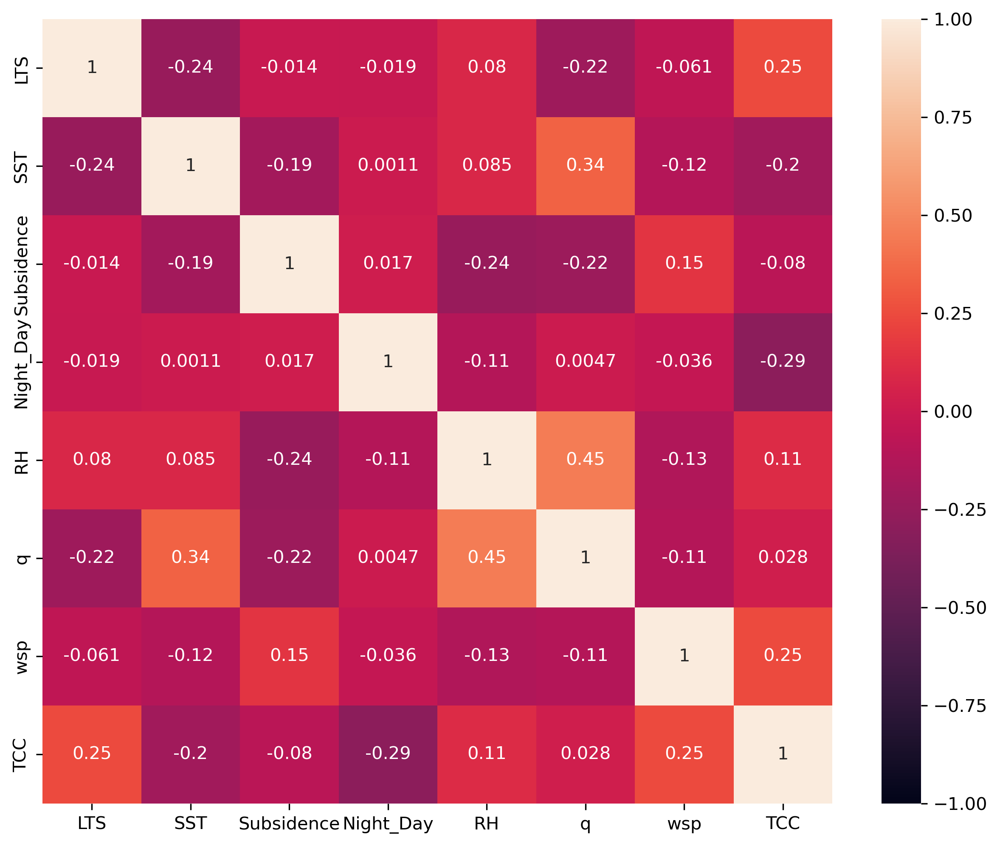

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

sns.heatmap(
    data=cov_matrix_flatten_to_1_day,
    vmin=-1,
    vmax=1,
    annot=True,
    ax=ax
)

plt.show()

### 9 Day full

In [19]:
df_full_2 = utl.read_time_series_data("full_rank_dataset")
for idx_day in np.arange(len(df_full_2)):
    df_full_2[idx_day] = df_full_2[idx_day][col_labels]
    df_full_2[idx_day] = df_full_2[idx_day].rename(columns={"{0}".format(label):"{0}_T{1}".format(label, idx_day) for label in col_labels})

In [20]:
col_labels_flat_9_timestamp = ["{0}_T{1}".format(label, idx) for label in col_labels for idx in np.arange(len(df_full_2))]

In [21]:
X_full_rank_flat_9_timestamp = pd.concat([df_full_2[idx_day] for idx_day in np.arange(len(df_full_2))], axis=1)[col_labels_flat_9_timestamp].to_numpy()

In [22]:
X_full_rank_flat_9_timestamp_scaler = StandardScaler().fit(X_full_rank_flat_9_timestamp)

In [23]:
cov_matrix_flat_9_timestamp = pd.DataFrame(
    data=X_full_rank_flat_9_timestamp_scaler.transform(X_full_rank_flat_9_timestamp), 
    columns=col_labels_flat_9_timestamp
).cov()

In [24]:
corr_matrix_flat_9_timestamp = pd.DataFrame(
    data=X_full_rank_flat_9_timestamp_scaler.transform(X_full_rank_flat_9_timestamp), 
    columns=col_labels_flat_9_timestamp
).corr()

In [25]:
cov_matrix_flat_9_timestamp

,LTS_T0,LTS_T1,LTS_T2,LTS_T3,LTS_T4,LTS_T5,LTS_T6,LTS_T7,LTS_T8,SST_T0,...,wsp_T8,TCC_T0,TCC_T1,TCC_T2,TCC_T3,TCC_T4,TCC_T5,TCC_T6,TCC_T7,TCC_T8
LTS_T0,1.000023,0.898792,0.728236,0.532266,0.368505,0.250323,0.184151,0.145551,0.121759,0.189262,...,-0.150499,0.123677,0.214811,0.262332,0.163494,0.167039,0.088390,0.066950,0.032942,0.023196
LTS_T1,0.898792,1.000023,0.890866,0.702591,0.515467,0.373816,0.286221,0.235593,0.201002,0.089329,...,-0.122940,0.050838,0.188371,0.270791,0.240993,0.229753,0.170004,0.107521,0.089209,0.043698
LTS_T2,0.728236,0.890866,1.000023,0.881159,0.702801,0.540328,0.429920,0.357804,0.310469,-0.046252,...,-0.080319,0.051458,0.127789,0.262404,0.259829,0.328703,0.235262,0.198085,0.131456,0.103927
LTS_T3,0.532266,0.702591,0.881159,1.000023,0.891760,0.742550,0.613531,0.524635,0.457414,-0.198927,...,-0.032731,0.037640,0.120298,0.202140,0.264131,0.352380,0.321424,0.257764,0.217343,0.148788
LTS_T4,0.368505,0.515467,0.702801,0.891760,1.000023,0.914070,0.793047,0.686368,0.600140,-0.323480,...,0.013167,0.055104,0.088835,0.186895,0.204976,0.347915,0.324721,0.324601,0.255308,0.214828
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCC_T4,0.167039,0.229753,0.328703,0.352380,0.347915,0.276696,0.238795,0.192675,0.176588,-0.342345,...,0.100164,0.232825,0.146941,0.472865,0.404363,1.000023,0.411045,0.469058,0.122644,0.233381
TCC_T5,0.088390,0.170004,0.235262,0.321424,0.324721,0.306650,0.249203,0.226431,0.195143,-0.331975,...,0.096303,0.004001,0.240618,0.137910,0.473646,0.411045,1.000023,0.355478,0.439771,0.121519
TCC_T6,0.066950,0.107521,0.198085,0.257764,0.324601,0.309074,0.288139,0.234339,0.214519,-0.284613,...,0.161029,0.152035,0.001984,0.246561,0.103212,0.469058,0.355478,1.000023,0.368778,0.435474
TCC_T7,0.032942,0.089209,0.131456,0.217343,0.255308,0.289861,0.266102,0.246843,0.206282,-0.234628,...,0.170002,-0.037374,0.144311,0.004022,0.239378,0.122644,0.439771,0.368778,1.000023,0.376293


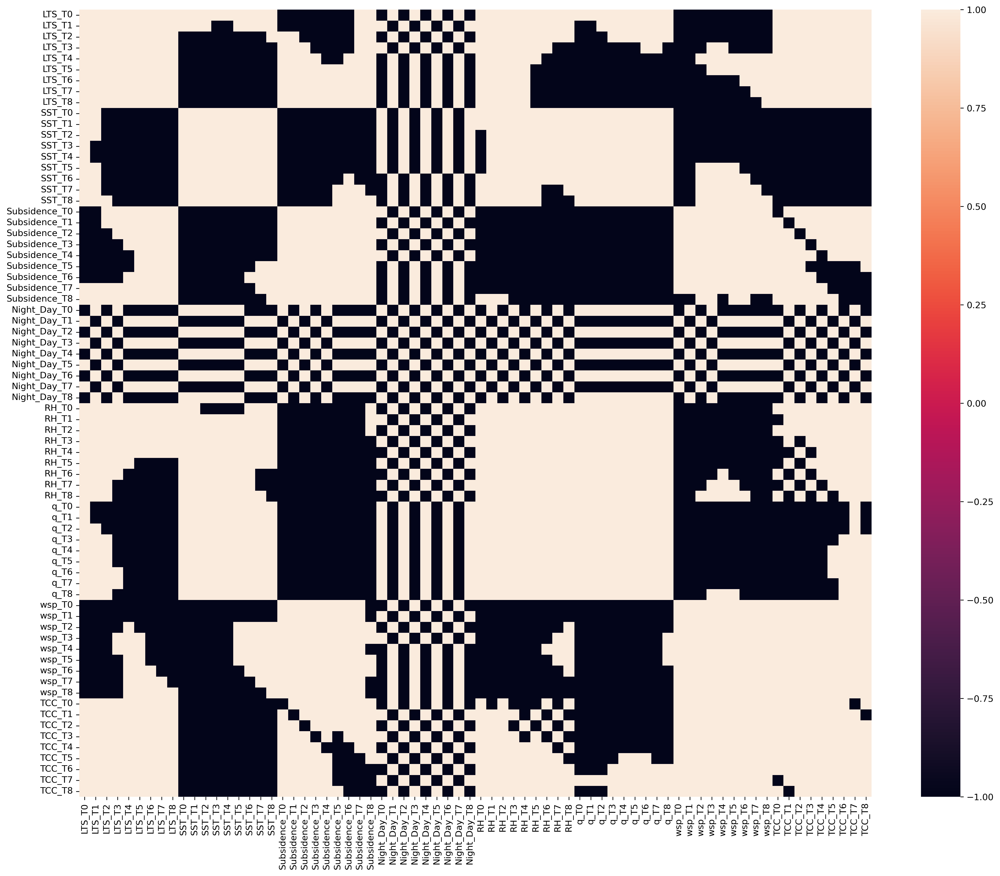

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

sns.heatmap(
    data=np.sign(corr_matrix_flat_9_timestamp),
    vmin=-1,
    vmax=1,
    ax=ax
)

plt.show()

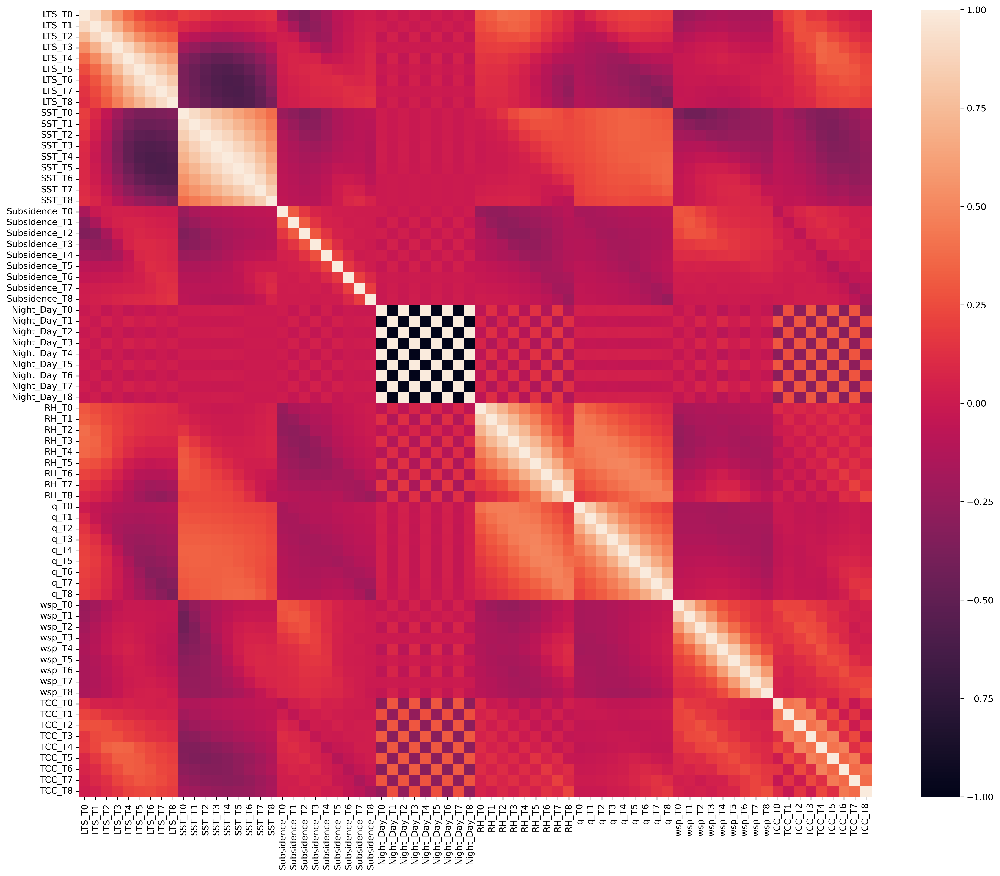

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

sns.heatmap(
    data=corr_matrix_flat_9_timestamp,
    vmin=-1,
    vmax=1,
    ax=ax
)

plt.show()

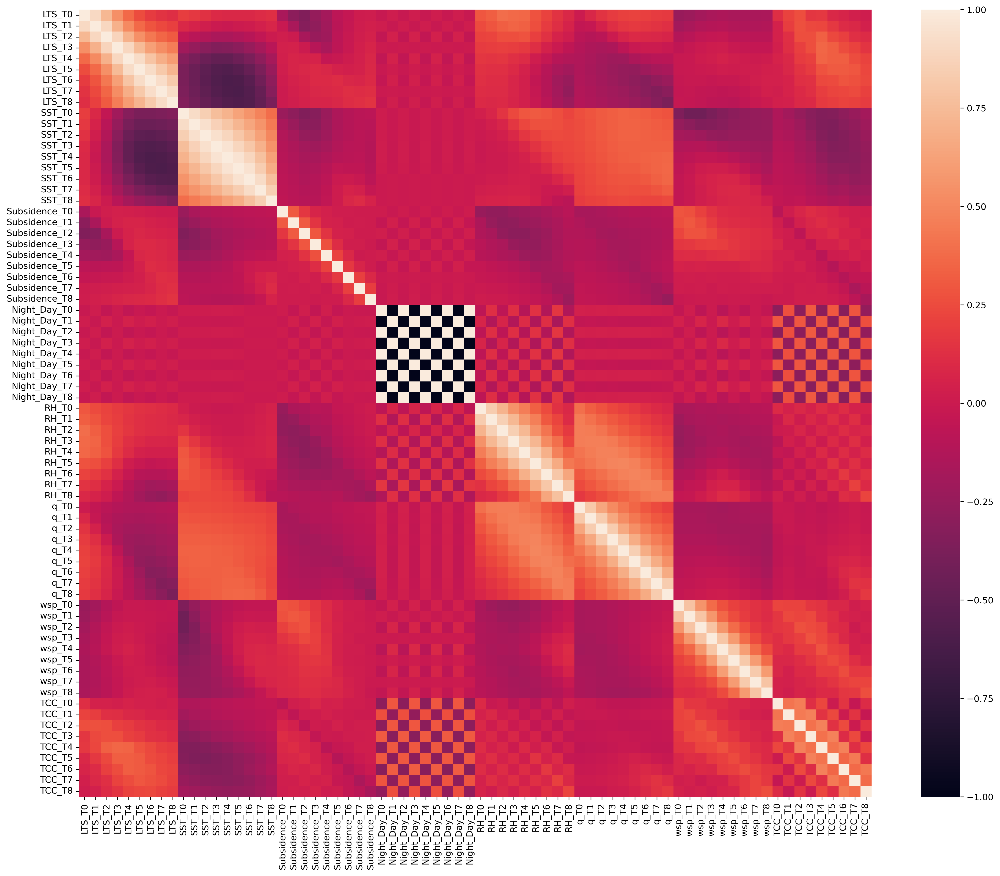

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

sns.heatmap(
    data=cov_matrix_flat_9_timestamp,
    vmin=-1,
    vmax=1,
    ax=ax
)

plt.show()

### By Parameter

In [29]:
def render_cov_param(param):
    filter_labels = ["{0}_T{1}".format(label, idx) for label in [param] for idx in np.arange(len(df_full_2))]
    fig, ax = plt.subplots(1, 1, figsize=(15, 12))

    sns.heatmap(
        data=cov_matrix_flat_9_timestamp.loc[filter_labels, filter_labels],
        annot=True,
        ax=ax
    )

    plt.show()
    
interact(render_cov_param, param=col_labels)

interactive(children=(Dropdown(description='param', options=('LTS', 'SST', 'Subsidence', 'Night_Day', 'RH', 'q…

<function __main__.render_cov_param(param)>

### By Timestamp

In [30]:
def render_cov_time_stamp(time_stamp, cap):
    filter_labels = ["{0}_T{1}".format(label, time_stamp) for label in col_labels]
    fig, ax = plt.subplots(1, 1, figsize=(15, 12))

    sns.heatmap(
        data=cap_cov_matrix(cov_matrix_flat_9_timestamp.loc[filter_labels, filter_labels], cap),
        annot=cov_matrix_flat_9_timestamp.loc[filter_labels, filter_labels],
        ax=ax
    )

    plt.show()
    
interact(render_cov_time_stamp, time_stamp=np.arange(len(df_full_2)), cap=widgets.IntSlider(50, 1, 100))

interactive(children=(Dropdown(description='time_stamp', options=(0, 1, 2, 3, 4, 5, 6, 7, 8), value=0), IntSli…

<function __main__.render_cov_time_stamp(time_stamp, cap)>

In [31]:
def render_cov_param(param):
    filter_labels = ["{0}_T{1}".format(label, idx) for label in [param] for idx in np.arange(len(df_full_2))]
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    plt.imshow(
        cov_matrix_flat_9_timestamp.loc[filter_labels, filter_labels].to_numpy(), 
        cmap="coolwarm", 
        vmax=1,
        vmin=0,
    )

    ax.set(
        ylabel="Timestamp T",
        xlabel="Timestamp T"
    )

    cb = plt.colorbar()
    cb.set_label('Covariance')

    plt.show()

    
interact(render_cov_param, param=col_labels)

interactive(children=(Dropdown(description='param', options=('LTS', 'SST', 'Subsidence', 'Night_Day', 'RH', 'q…

<function __main__.render_cov_param(param)>

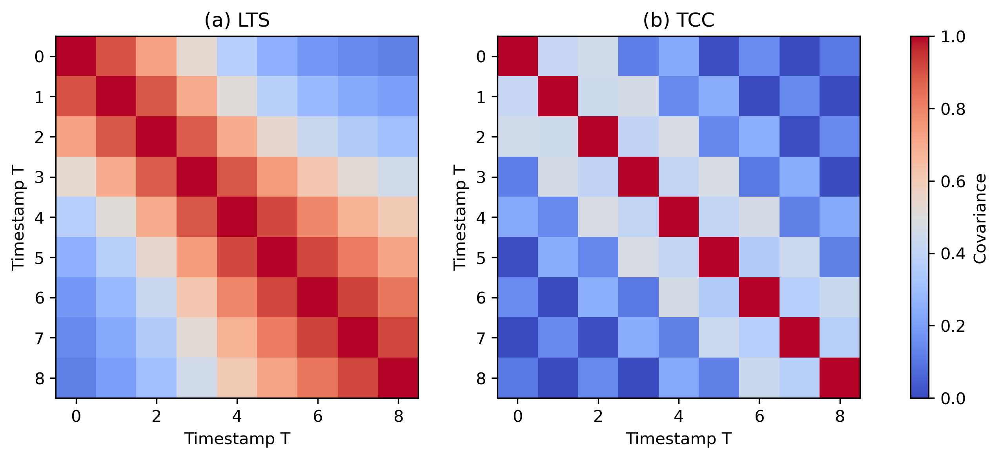

In [32]:
def get_cov_matrix(param):
    filter_labels = ["{0}_T{1}".format(label, idx) for label in [param] for idx in np.arange(len(df_full_2))]
    return cov_matrix_flat_9_timestamp.loc[filter_labels, filter_labels].to_numpy()

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

img1 = axes[0].imshow(
    get_cov_matrix("LTS"),
    cmap="coolwarm", 
    vmax=1,
    vmin=0,
)
axes[0].set(
    ylabel="Timestamp T",
    xlabel="Timestamp T",
    title="(a) LTS"
)

img2 = axes[1].imshow(
    get_cov_matrix("TCC"),
    cmap="coolwarm", 
    vmax=1,
    vmin=0,
)
axes[1].set(
    ylabel="Timestamp T",
    xlabel="Timestamp T",
    title="(b) TCC"
)

fig.subplots_adjust(right=1.2)
cb = fig.colorbar(img2, ax=axes)
cb.set_label('Covariance')

plt.show()

In [33]:
cov_matrix_flat_9_timestamp

,LTS_T0,LTS_T1,LTS_T2,LTS_T3,LTS_T4,LTS_T5,LTS_T6,LTS_T7,LTS_T8,SST_T0,...,wsp_T8,TCC_T0,TCC_T1,TCC_T2,TCC_T3,TCC_T4,TCC_T5,TCC_T6,TCC_T7,TCC_T8
LTS_T0,1.000023,0.898792,0.728236,0.532266,0.368505,0.250323,0.184151,0.145551,0.121759,0.189262,...,-0.150499,0.123677,0.214811,0.262332,0.163494,0.167039,0.088390,0.066950,0.032942,0.023196
LTS_T1,0.898792,1.000023,0.890866,0.702591,0.515467,0.373816,0.286221,0.235593,0.201002,0.089329,...,-0.122940,0.050838,0.188371,0.270791,0.240993,0.229753,0.170004,0.107521,0.089209,0.043698
LTS_T2,0.728236,0.890866,1.000023,0.881159,0.702801,0.540328,0.429920,0.357804,0.310469,-0.046252,...,-0.080319,0.051458,0.127789,0.262404,0.259829,0.328703,0.235262,0.198085,0.131456,0.103927
LTS_T3,0.532266,0.702591,0.881159,1.000023,0.891760,0.742550,0.613531,0.524635,0.457414,-0.198927,...,-0.032731,0.037640,0.120298,0.202140,0.264131,0.352380,0.321424,0.257764,0.217343,0.148788
LTS_T4,0.368505,0.515467,0.702801,0.891760,1.000023,0.914070,0.793047,0.686368,0.600140,-0.323480,...,0.013167,0.055104,0.088835,0.186895,0.204976,0.347915,0.324721,0.324601,0.255308,0.214828
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCC_T4,0.167039,0.229753,0.328703,0.352380,0.347915,0.276696,0.238795,0.192675,0.176588,-0.342345,...,0.100164,0.232825,0.146941,0.472865,0.404363,1.000023,0.411045,0.469058,0.122644,0.233381
TCC_T5,0.088390,0.170004,0.235262,0.321424,0.324721,0.306650,0.249203,0.226431,0.195143,-0.331975,...,0.096303,0.004001,0.240618,0.137910,0.473646,0.411045,1.000023,0.355478,0.439771,0.121519
TCC_T6,0.066950,0.107521,0.198085,0.257764,0.324601,0.309074,0.288139,0.234339,0.214519,-0.284613,...,0.161029,0.152035,0.001984,0.246561,0.103212,0.469058,0.355478,1.000023,0.368778,0.435474
TCC_T7,0.032942,0.089209,0.131456,0.217343,0.255308,0.289861,0.266102,0.246843,0.206282,-0.234628,...,0.170002,-0.037374,0.144311,0.004022,0.239378,0.122644,0.439771,0.368778,1.000023,0.376293


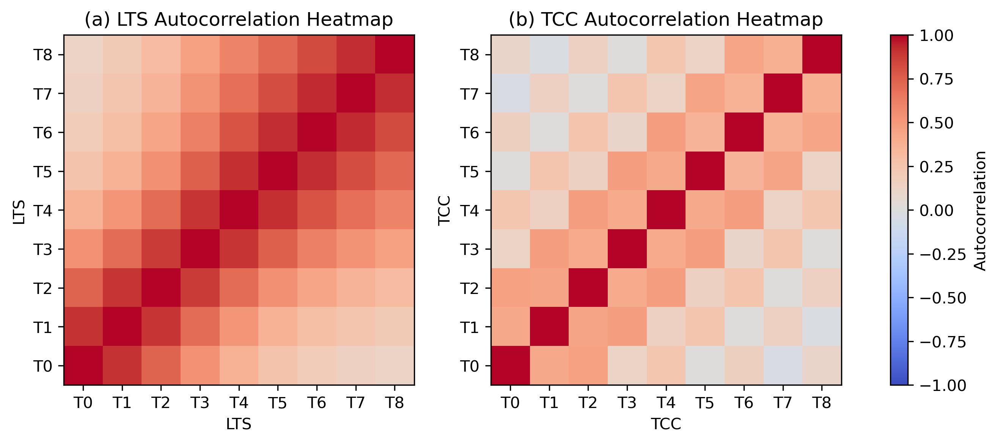

In [34]:
def get_corr_matrix(param):
    filter_labels = ["{0}_T{1}".format(label, idx) for label in [param] for idx in np.arange(len(df_full_2))]
    return corr_matrix_flat_9_timestamp.loc[filter_labels, filter_labels].to_numpy()


fig, axes = plt.subplots(1, 2, figsize=(8, 4))

img1 = axes[0].imshow(
    get_corr_matrix("LTS")[::-1],
    cmap="coolwarm", 
    vmax=1,
    vmin=-1,
)
axes[0].set(
    ylabel="LTS",
    xlabel="LTS",
    title="(a) LTS Autocorrelation Heatmap", 
    xticks=[x for x in np.arange(9)],
    xticklabels=[f"T{x}" for x in np.arange(9)],
    yticks=[x for x in np.arange(9)[::-1]],
    yticklabels=[f"T{x}" for x in np.arange(9)],
)

img2 = axes[1].imshow(
    get_corr_matrix("TCC")[::-1],
    cmap="coolwarm", 
    vmax=1,
    vmin=-1,
)
axes[1].set(
    ylabel="TCC",
    xlabel="TCC",
    title="(b) TCC Autocorrelation Heatmap", 
    xticks=[x for x in np.arange(9)],
    xticklabels=[f"T{x}" for x in np.arange(9)],
    yticks=[x for x in np.arange(9)[::-1]],
    yticklabels=[f"T{x}" for x in np.arange(9)],
)

fig.subplots_adjust(right=1.2)
cb = fig.colorbar(img2, ax=axes)
cb.set_label('Autocorrelation')

plt.show()

In [35]:
get_corr_matrix("TCC")[::-1]

array([[ 0.10734781, -0.027065  ,  0.14265522,  0.00351048,  0.23337576,
         0.12151583,  0.4354645 ,  0.37628414,  1.        ],
       [-0.03737289,  0.14430781,  0.00402159,  0.23937259,  0.12264122,
         0.43976082,  0.36876991,  1.        ,  0.37628414],
       [ 0.15203191,  0.00198375,  0.24655499,  0.1032101 ,  0.46904708,
         0.35546976,  1.        ,  0.36876991,  0.4354645 ],
       [ 0.00400047,  0.24061232,  0.13790676,  0.47363559,  0.41103518,
         1.        ,  0.35546976,  0.43976082,  0.12151583],
       [ 0.23282002,  0.14693782,  0.47285385,  0.40435386,  1.        ,
         0.41103518,  0.46904708,  0.12264122,  0.23337576],
       [ 0.12101302,  0.47263966,  0.40210978,  1.        ,  0.40435386,
         0.47363559,  0.1032101 ,  0.23937259,  0.00351048],
       [ 0.45484197,  0.4436846 ,  1.        ,  0.40210978,  0.47285385,
         0.13790676,  0.24655499,  0.00402159,  0.14265522],
       [ 0.41711685,  1.        ,  0.4436846 ,  0.47263966,  0

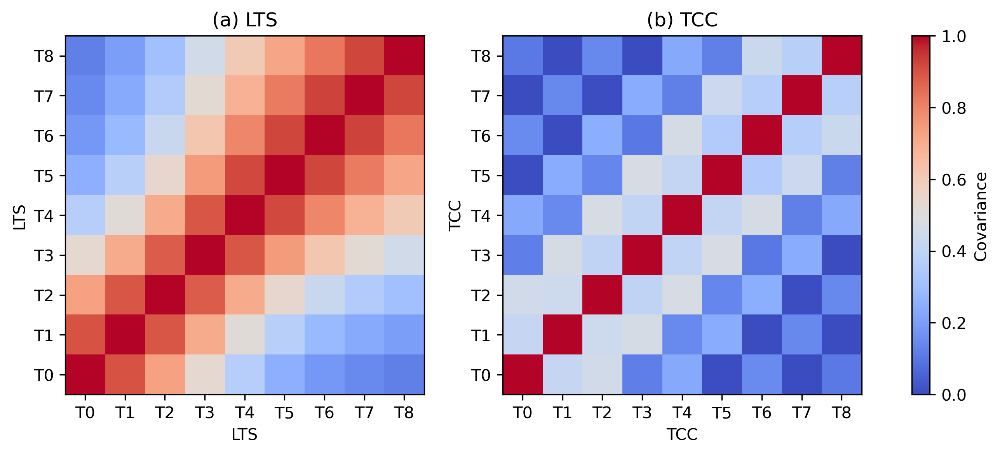

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

img1 = axes[0].imshow(
    get_cov_matrix("LTS")[::-1],
    cmap="coolwarm", 
    vmax=1,
    vmin=0,
)
axes[0].set(
    ylabel="LTS",
    xlabel="LTS",
    title="(a) LTS", 
    xticks=[x for x in np.arange(9)],
    xticklabels=[f"T{x}" for x in np.arange(9)],
    yticks=[x for x in np.arange(9)[::-1]],
    yticklabels=[f"T{x}" for x in np.arange(9)],
)

img2 = axes[1].imshow(
    get_cov_matrix("TCC")[::-1],
    cmap="coolwarm", 
    vmax=1,
    vmin=0,
)
axes[1].set(
    ylabel="TCC",
    xlabel="TCC",
    title="(b) TCC", 
    xticks=[x for x in np.arange(9)],
    xticklabels=[f"T{x}" for x in np.arange(9)],
    yticks=[x for x in np.arange(9)[::-1]],
    yticklabels=[f"T{x}" for x in np.arange(9)],
)

fig.subplots_adjust(right=1.2)
cb = fig.colorbar(img2, ax=axes)
cb.set_label('Covariance')

plt.show()

## Cov Matrix Anomaly Data

In [37]:
df_full_anomaly = utl.read_time_series_data("full_rank_dataset_anormaly")

In [38]:
df_full_anomaly[0].columns

Index(['index', 'LTS', 'SST', 'Subsidence', 'Night_Day', 'RH', 'q', 'wsp',
       'LTS_A', 'SST_A', 'Subsidence_A', 'RH_A', 'q_A', 'wsp_A', 'TCC'],
      dtype='object')

In [39]:
col_labels_anomaly = ['LTS_A', 'SST_A', 'Subsidence_A', 'Night_Day', 'RH_A', 'q_A', 'wsp_A', 'TCC']

### 1 Day Full

In [40]:
X_full_rank_A = np.array([df_full_anomaly[idx_day][col_labels_anomaly].to_numpy() for idx_day in np.arange(len(df_full_anomaly))])

In [41]:
X_full_rank_flatten_to_1_day_A = np.concatenate([X_full_rank_A[idx_day] for idx_day in np.arange(X_full_rank_A.shape[0])])

In [42]:
X_full_rank_scaler_A = StandardScaler().fit(X_full_rank_flatten_to_1_day_A)

In [43]:
cov_matrix_flatten_to_1_day_A = pd.DataFrame(X_full_rank_scaler_A.transform(X_full_rank_flatten_to_1_day_A), columns=col_labels_anomaly).cov()

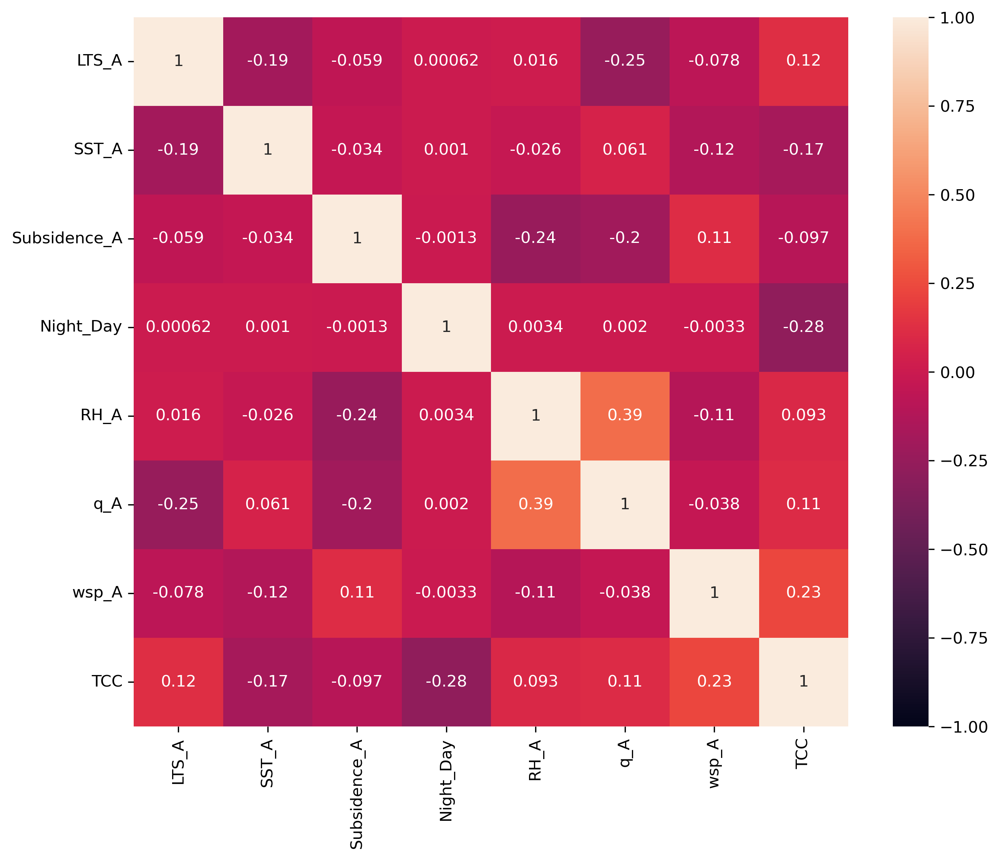

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

sns.heatmap(
    data=cov_matrix_flatten_to_1_day_A,
    vmin=-1,
    vmax=1,
    annot=True,
    ax=ax
)

plt.show()

### 9 Day full

In [45]:
df_full_2_A =  utl.read_time_series_data("full_rank_dataset_anormaly")
for idx_day in np.arange(len(df_full_2_A)):
    df_full_2_A[idx_day] = df_full_2_A[idx_day][col_labels_anomaly]
    df_full_2_A[idx_day] = df_full_2_A[idx_day].rename(columns={"{0}".format(label):"{0}_T{1}".format(label, idx_day) for label in col_labels_anomaly})

In [46]:
col_labels_flat_9_timestamp_A = ["{0}_T{1}".format(label, idx) for label in col_labels_anomaly for idx in np.arange(len(df_full_2_A))]

In [47]:
X_full_rank_flat_9_timestamp_A = pd.concat([df_full_2_A[idx_day] for idx_day in np.arange(len(df_full_2_A))], axis=1)[col_labels_flat_9_timestamp_A].to_numpy()

In [48]:
X_full_rank_flat_9_timestamp_scaler_A = StandardScaler().fit(X_full_rank_flat_9_timestamp_A)

In [49]:
cov_matrix_flat_9_timestamp_A = pd.DataFrame(
    data=X_full_rank_flat_9_timestamp_scaler_A.transform(X_full_rank_flat_9_timestamp_A), 
    columns=col_labels_flat_9_timestamp_A
).cov()

In [50]:
cov_matrix_flat_9_timestamp_A

,LTS_A_T0,LTS_A_T1,LTS_A_T2,LTS_A_T3,LTS_A_T4,LTS_A_T5,LTS_A_T6,LTS_A_T7,LTS_A_T8,SST_A_T0,...,wsp_A_T8,TCC_T0,TCC_T1,TCC_T2,TCC_T3,TCC_T4,TCC_T5,TCC_T6,TCC_T7,TCC_T8
LTS_A_T0,1.000021,0.838067,0.597207,0.382738,0.245511,0.169780,0.124301,0.090643,0.060578,-0.124330,...,-0.080477,0.116011,0.198177,0.178329,0.102967,0.066633,0.042006,0.003449,0.013238,-0.005694
LTS_A_T1,0.838067,1.000021,0.819438,0.565111,0.372339,0.254600,0.183161,0.136401,0.098736,-0.136390,...,-0.078487,0.044607,0.151122,0.190059,0.146519,0.102379,0.066886,0.011111,0.021370,-0.003516
LTS_A_T2,0.597207,0.819438,1.000021,0.809233,0.574336,0.402983,0.281884,0.207702,0.152068,-0.157888,...,-0.072428,0.027323,0.092978,0.156811,0.172872,0.164253,0.108470,0.042270,0.037528,0.010057
LTS_A_T3,0.382738,0.565111,0.809233,1.000021,0.820527,0.609426,0.433156,0.317567,0.232626,-0.173281,...,-0.058669,0.027533,0.078644,0.107517,0.158223,0.189763,0.151782,0.075631,0.063320,0.028200
LTS_A_T4,0.245511,0.372339,0.574336,0.820527,1.000021,0.843757,0.632680,0.466642,0.333282,-0.178378,...,-0.049879,0.031315,0.067164,0.086824,0.115390,0.169502,0.157604,0.110307,0.087286,0.052531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCC_T4,0.066633,0.102379,0.164253,0.189763,0.169502,0.121200,0.090654,0.080269,0.069982,-0.190030,...,0.029526,0.221626,0.143677,0.458545,0.409294,1.000021,0.416573,0.450893,0.118499,0.215916
TCC_T5,0.042006,0.066886,0.108470,0.151782,0.157604,0.126490,0.087662,0.071480,0.071769,-0.172209,...,0.056237,0.003501,0.231596,0.133839,0.463802,0.416573,1.000021,0.361719,0.424944,0.118784
TCC_T6,0.003449,0.011111,0.042270,0.075631,0.110307,0.107906,0.088841,0.072881,0.069582,-0.134929,...,0.110980,0.143962,0.005771,0.233473,0.102681,0.450893,0.361719,1.000021,0.386810,0.430397
TCC_T7,0.013238,0.021370,0.037528,0.063320,0.087286,0.096639,0.083829,0.061222,0.051855,-0.119727,...,0.159674,-0.035426,0.138131,0.004771,0.227964,0.118499,0.424944,0.386810,1.000021,0.396224


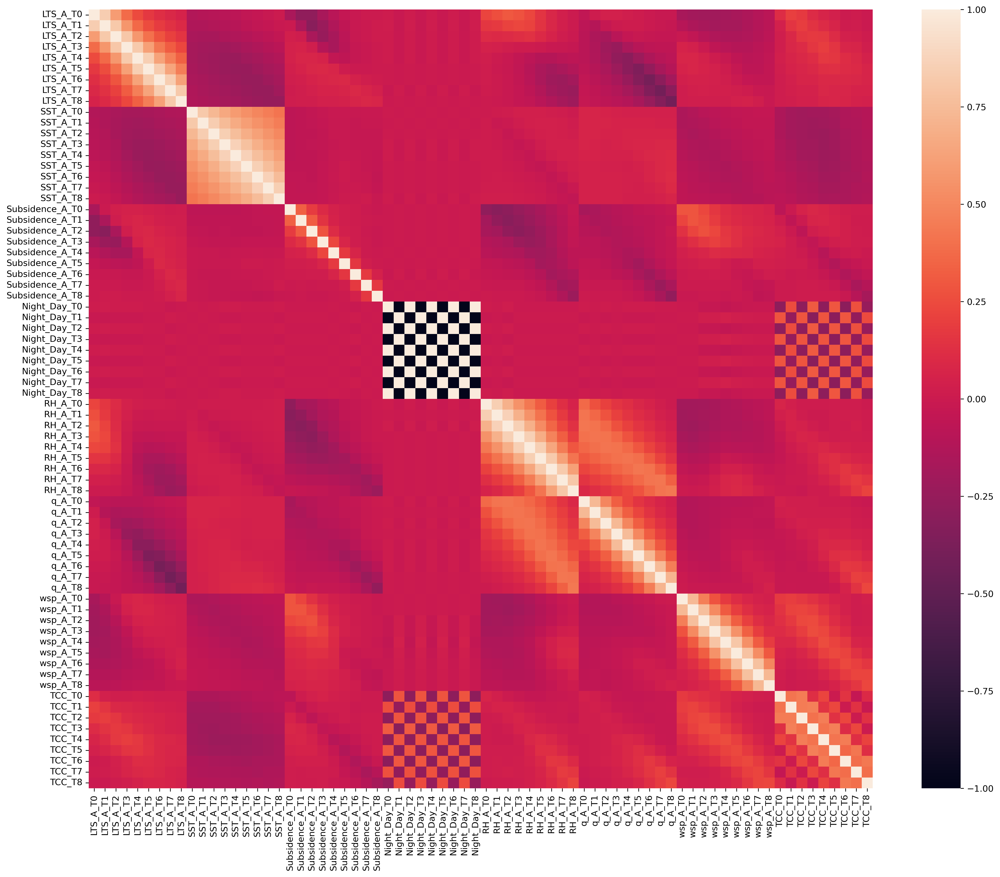

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

sns.heatmap(
    data=cov_matrix_flat_9_timestamp_A,
    vmin=-1,
    vmax=1,
    ax=ax
)

plt.show()

### By Parameter

In [52]:
def render_cov_param_A(param):
    filter_labels = ["{0}_T{1}".format(label, idx) for label in [param] for idx in np.arange(len(df_full_2_A))]
    fig, ax = plt.subplots(1, 1, figsize=(15, 12))

    sns.heatmap(
        data=cov_matrix_flat_9_timestamp_A.loc[filter_labels, filter_labels],
        annot=True,
        ax=ax
    )

    plt.show()
    
interact(render_cov_param_A, param=col_labels_anomaly)

interactive(children=(Dropdown(description='param', options=('LTS_A', 'SST_A', 'Subsidence_A', 'Night_Day', 'R…

<function __main__.render_cov_param_A(param)>

### By Timestamp

In [53]:
def render_cov_time_stamp_A(time_stamp, cap):
    filter_labels = ["{0}_T{1}".format(label, time_stamp) for label in col_labels_anomaly]
    fig, ax = plt.subplots(1, 1, figsize=(15, 12))

    sns.heatmap(
        data=cap_cov_matrix(cov_matrix_flat_9_timestamp_A.loc[filter_labels, filter_labels], cap),
        annot=cov_matrix_flat_9_timestamp_A.loc[filter_labels, filter_labels],
        ax=ax
    )

    plt.show()
    
interact(render_cov_time_stamp_A, time_stamp=np.arange(len(df_full_2_A)), cap=widgets.IntSlider(50, 1, 100))

interactive(children=(Dropdown(description='time_stamp', options=(0, 1, 2, 3, 4, 5, 6, 7, 8), value=0), IntSli…

<function __main__.render_cov_time_stamp_A(time_stamp, cap)>

### Anomally Difference

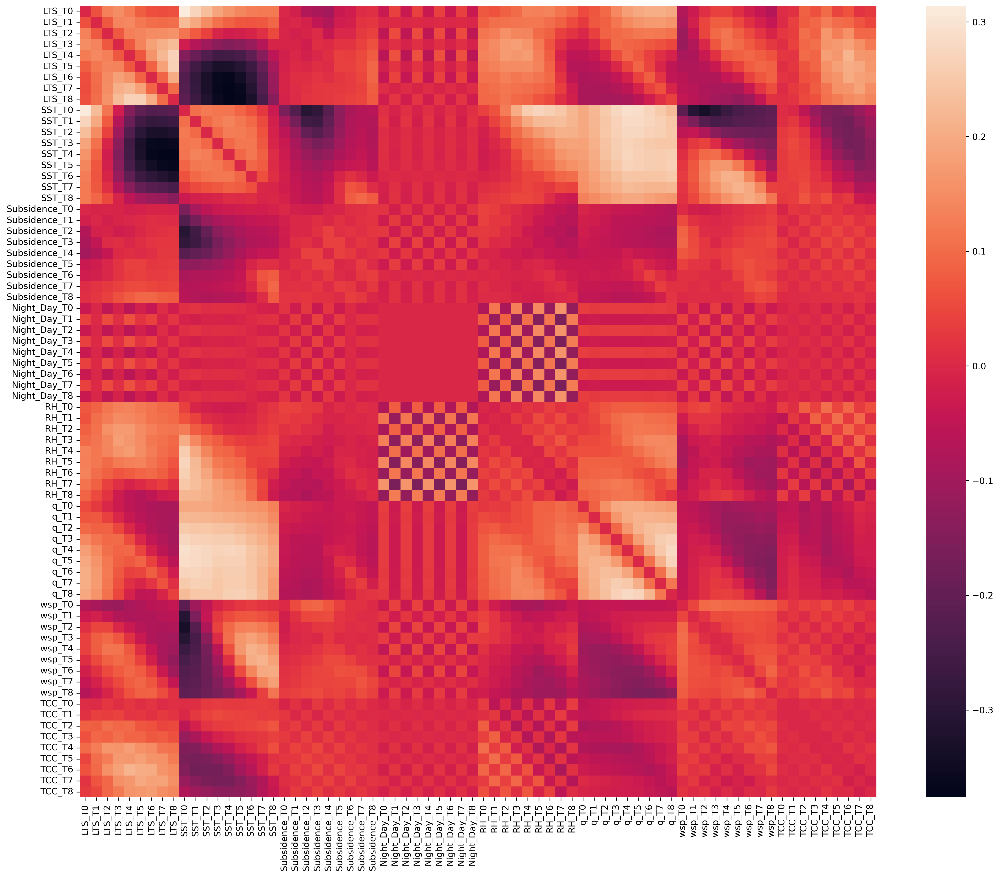

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

sns.heatmap(
    data=cov_matrix_flat_9_timestamp - cov_matrix_flat_9_timestamp_A.rename(
        index={k: v for k, v in zip(cov_matrix_flat_9_timestamp_A, cov_matrix_flat_9_timestamp)},
        columns={k: v for k, v in zip(cov_matrix_flat_9_timestamp_A, cov_matrix_flat_9_timestamp)},
    ),
    ax=ax
)

plt.show()

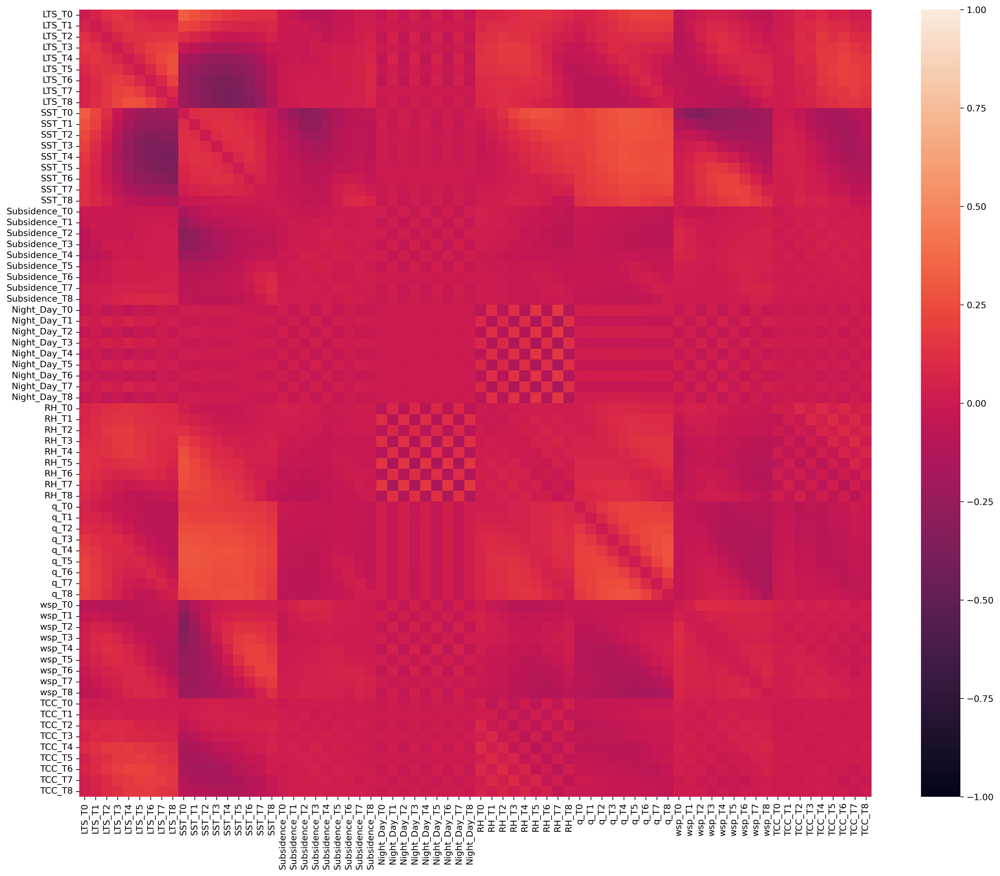

In [55]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

sns.heatmap(
    data=cov_matrix_flat_9_timestamp - cov_matrix_flat_9_timestamp_A.rename(
        index={k: v for k, v in zip(cov_matrix_flat_9_timestamp_A, cov_matrix_flat_9_timestamp)},
        columns={k: v for k, v in zip(cov_matrix_flat_9_timestamp_A, cov_matrix_flat_9_timestamp)},
    ),
    vmin=-1,
    vmax=1,
    ax=ax
)

plt.show()

## PCA

In [56]:
print("Feature Explained")
for i, pc in enumerate(PCA(n_components=7).fit(StandardScaler().fit_transform(X_full_rank_flatten_to_1_day[:, :-1])).explained_variance_ratio_):
    print("    PC{0}: {1:.2f}%".format(i, pc * 100))

Feature Explained
    PC0: 26.99%
    PC1: 17.71%
    PC2: 15.00%
    PC3: 12.78%
    PC4: 11.60%
    PC5: 9.68%
    PC6: 6.23%


In [57]:
pca = PCA(n_components=2)
pc_0_1 = pca.fit_transform(StandardScaler().fit_transform(X_full_rank_flatten_to_1_day[:, :-1]))
TCC = X_full_rank_flatten_to_1_day[:, -1]

In [58]:
df_pca = pd.DataFrame([{"pc0": pc[0], "pc1": pc[1], "TCC": tcc} for (pc, tcc) in zip(pc_0_1, TCC)])

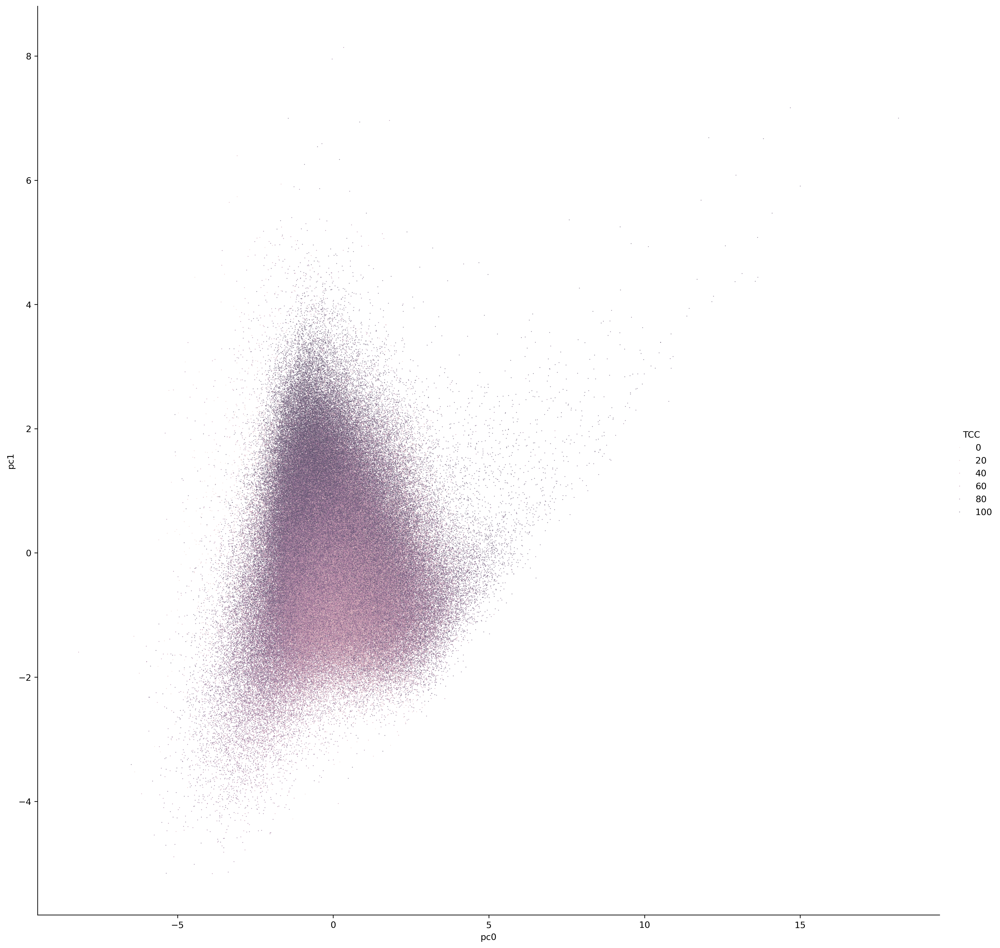

In [59]:
sns.relplot(
    data=df_pca,
    x="pc0",
    y="pc1",
    hue="TCC",
    aspect=1,
    height=15,
    alpha=0.5,
    s=1
)
plt.show()

In [60]:
pd.DataFrame(pca.components_, columns=col_labels[:-1])

,LTS,SST,Subsidence,Night_Day,RH,q,wsp
0,-0.192546,0.435319,-0.401813,-0.047464,0.464464,0.577134,-0.246795
1,0.707890,-0.383543,-0.236282,-0.221737,0.402429,-0.098374,-0.274159


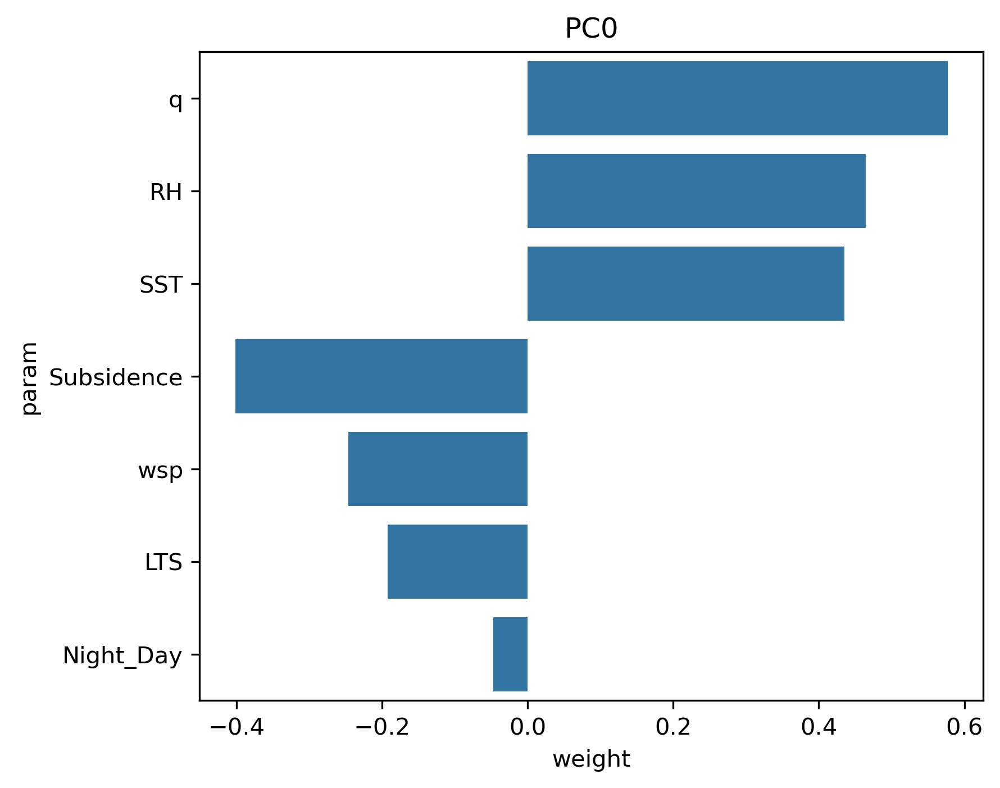

In [61]:
a = list(zip(col_labels[:-1], pca.components_[0].tolist()))
a.sort(key=lambda s: abs(s[1]), reverse=True)

fig, ax = plt.subplots(1, 1, figsize=(6, 5))
sns.barplot(
    data=pd.DataFrame(a, columns=["param", "weight"]),
    x="weight",
    y="param",
    ax=ax
)
plt.title("PC0")
plt.show()

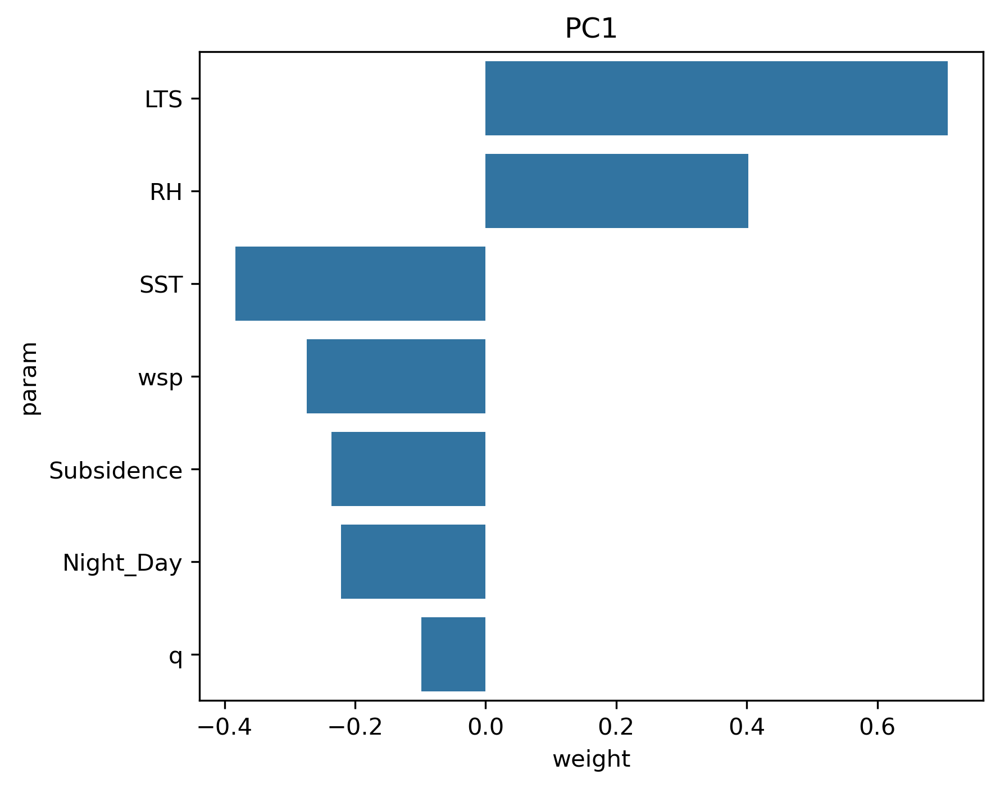

In [62]:
a = list(zip(col_labels[:-1], pca.components_[1].tolist()))
a.sort(key=lambda s: abs(s[1]), reverse=True)

fig, ax = plt.subplots(1, 1, figsize=(6, 5))
sns.barplot(
    data=pd.DataFrame(a, columns=["param", "weight"]),
    x="weight",
    y="param",
    ax=ax
)
plt.title("PC1")
plt.show()

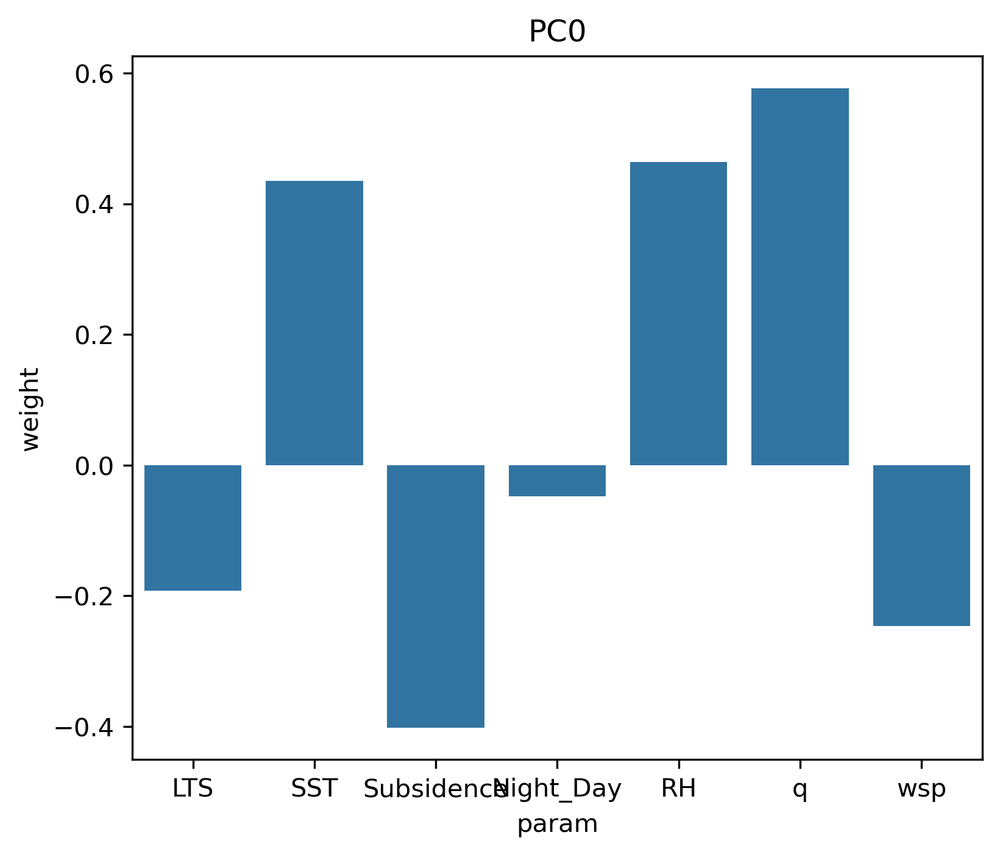

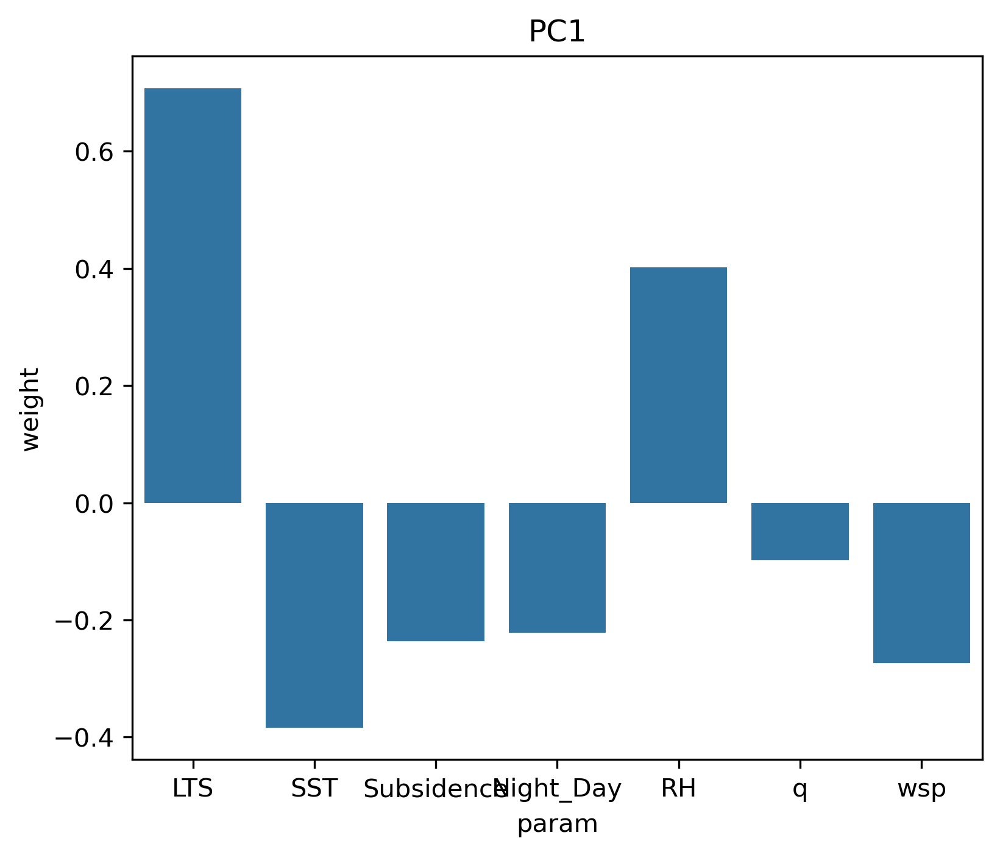

In [63]:
a = list(zip(col_labels[:-1], pca.components_[0].tolist()))

fig, ax = plt.subplots(1, 1, figsize=(6, 5))
sns.barplot(
    data=pd.DataFrame(a, columns=["param", "weight"]),
    y="weight",
    x="param",
    ax=ax
)
plt.title("PC0")
plt.show()

a = list(zip(col_labels[:-1], pca.components_[1].tolist()))

fig, ax = plt.subplots(1, 1, figsize=(6, 5))
sns.barplot(
    data=pd.DataFrame(a, columns=["param", "weight"]),
    y="weight",
    x="param",
    ax=ax
)
plt.title("PC1")
plt.show()